Processing GRIA1 using Linear, KNN, and Spline Interpolation...
Processing GRIA2 using Linear, KNN, and Spline Interpolation...
Processing GRIA3 using Linear, KNN, and Spline Interpolation...
Processing GRIA4 using Linear, KNN, and Spline Interpolation...
Processing GRIN1 using Linear, KNN, and Spline Interpolation...
Processing GRIN2A using Linear, KNN, and Spline Interpolation...
Processing GRIN2B using Linear, KNN, and Spline Interpolation...
Processing GRIN2C using Linear, KNN, and Spline Interpolation...
Processing GRIN2D using Linear, KNN, and Spline Interpolation...
Processing GRM1 using Linear, KNN, and Spline Interpolation...
Processing GRM2 using Linear, KNN, and Spline Interpolation...
Processing GRM3 using Linear, KNN, and Spline Interpolation...
Processing GRM4 using Linear, KNN, and Spline Interpolation...
Processing GRM5 using Linear, KNN, and Spline Interpolation...
Processing GRM7 using Linear, KNN, and Spline Interpolation...
Processing GRM8 using Linear, KNN, and Spl

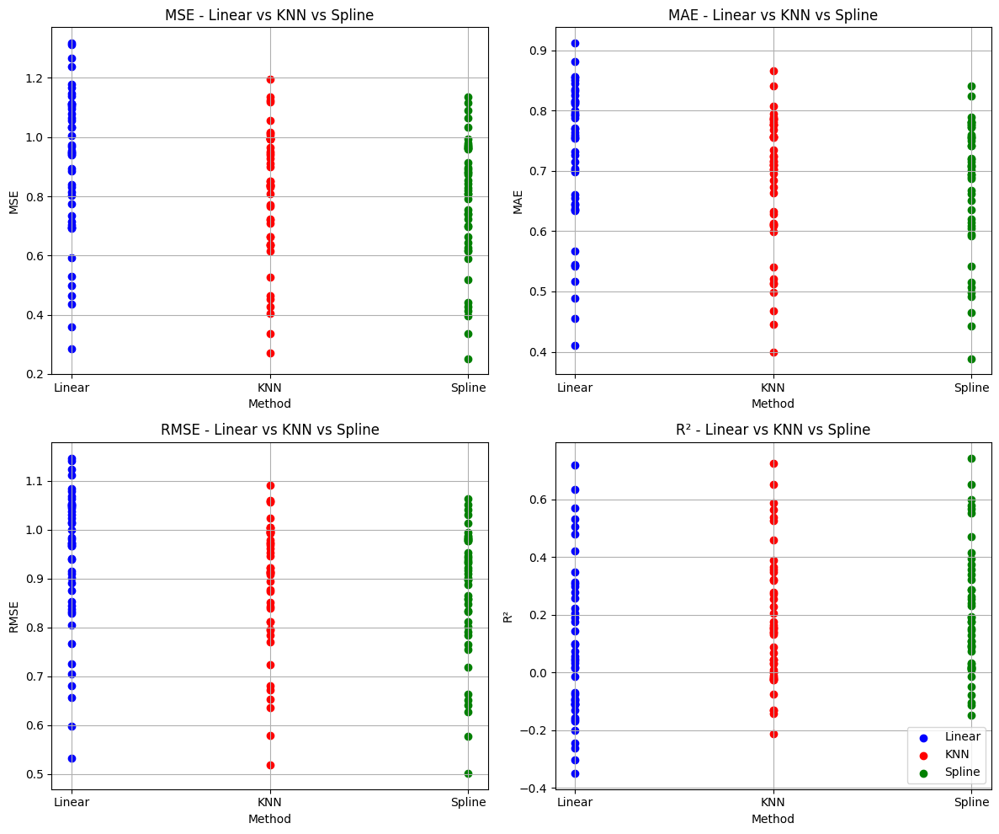


Average Metrics for Linear, KNN, and Spline Across Genes:

Linear:
 MSE     0.901897
MAE     0.719664
RMSE    0.935747
R²      0.092375
dtype: float64

KNN:
 MSE     0.810831
MAE     0.683265
RMSE    0.888062
R²      0.176661
dtype: float64

Spline:
 MSE     0.786054
MAE     0.673912
RMSE    0.874295
R²      0.202624
dtype: float64

Paired t-tests (Linear vs KNN):
MSE: t = 15.4294, p = 0.0000
MAE: t = 17.0944, p = 0.0000
RMSE: t = 19.0595, p = 0.0000
R²: t = -13.7361, p = 0.0000

Paired t-tests (Linear vs Spline):
MSE: t = 15.7067, p = 0.0000
MAE: t = 16.6024, p = 0.0000
RMSE: t = 19.6419, p = 0.0000
R²: t = -14.1835, p = 0.0000

Paired t-tests (KNN vs Spline):
MSE: t = 10.0045, p = 0.0000
MAE: t = 8.2105, p = 0.0000
RMSE: t = 10.8560, p = 0.0000
R²: t = -9.9744, p = 0.0000


In [ ]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsRegressor
from scipy.interpolate import Rbf, griddata
from scipy.spatial import ConvexHull, Delaunay
from math import sqrt
import pandas as pd

expression_coords = np.load('expression_coords.npy')
expression_data = np.load('expression.npy', allow_pickle=True).item()

x, y, z = expression_coords[:, 0], expression_coords[:, 1], expression_coords[:, 2]
xyz_points = np.column_stack((x, y, z))

hull = ConvexHull(xyz_points)
delaunay = Delaunay(xyz_points)

resolution = 30
grid_x, grid_y, grid_z = np.meshgrid(
    np.linspace(min(x), max(x), resolution),
    np.linspace(min(y), max(y), resolution),
    np.linspace(min(z), max(z), resolution)
)


grid_points = np.column_stack((grid_x.ravel(), grid_y.ravel(), grid_z.ravel()))


inside_hull = delaunay.find_simplex(grid_points) >= 0
valid_points = grid_points[inside_hull]


num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=100)


genes_to_process = list(expression_data.keys())  # All 46 genes
metrics = ['MSE', 'MAE', 'RMSE', 'R²']


linear_results = np.zeros((len(genes_to_process), num_folds, len(metrics)))
knn_results = np.zeros((len(genes_to_process), num_folds, len(metrics)))
spline_results = np.zeros((len(genes_to_process), num_folds, len(metrics)))


n_neighbors = 5


smoothness = 0.2


for gene_idx, gene in enumerate(genes_to_process):
    print(f"Processing {gene} using Linear, KNN, and Spline Interpolation...")

    values = cp.asarray(expression_data[gene])

    for i, (train_index, test_index) in enumerate(kf.split(expression_coords)):
        train_coords = cp.asarray(expression_coords[train_index])
        test_coords = cp.asarray(expression_coords[test_index])
        train_values = values[train_index]
        test_values = values[test_index]

        # Linear Interpolation (CPU-based)
        pred_linear = griddata(
            train_coords.get(), train_values.get(), test_coords.get(), method='linear'
        )

        valid_indices = ~np.isnan(pred_linear)
        pred_linear = pred_linear[valid_indices]
        test_values_linear = test_values.get()[valid_indices]

        if len(pred_linear) > 0:
            mse = mean_squared_error(test_values_linear, pred_linear)
            mae = mean_absolute_error(test_values_linear, pred_linear)
            rmse = sqrt(mse)
            r2 = r2_score(test_values_linear, pred_linear)
            linear_results[gene_idx, i] = [mse, mae, rmse, r2]

        # KNN Interpolation (CPU-based)
        knn = KNeighborsRegressor(n_neighbors=n_neighbors, weights='distance')
        knn.fit(train_coords.get(), train_values.get())
        pred_knn = knn.predict(test_coords.get())

        valid_indices = ~np.isnan(pred_knn)
        pred_knn = pred_knn[valid_indices]
        test_values_knn = test_values.get()[valid_indices]

        if len(pred_knn) > 0:
            mse = mean_squared_error(test_values_knn, pred_knn)
            mae = mean_absolute_error(test_values_knn, pred_knn)
            rmse = sqrt(mse)
            r2 = r2_score(test_values_knn, pred_knn)
            knn_results[gene_idx, i] = [mse, mae, rmse, r2]

        # Spline Interpolation (GPU-based)
        interpolator = Rbf(
            train_coords[:, 0].get(), train_coords[:, 1].get(), train_coords[:, 2].get(),
            train_values.get(), function='multiquadric', smooth=smoothness
        )

        pred_spline = interpolator(
            test_coords[:, 0].get(), test_coords[:, 1].get(), test_coords[:, 2].get()
        )

        valid_indices = ~np.isnan(pred_spline)
        pred_spline = pred_spline[valid_indices]
        test_values_spline = test_values.get()[valid_indices]

        if len(pred_spline) > 0:
            mse = mean_squared_error(test_values_spline, pred_spline)
            mae = mean_absolute_error(test_values_spline, pred_spline)
            rmse = sqrt(mse)
            r2 = r2_score(test_values_spline, pred_spline)
            spline_results[gene_idx, i] = [mse, mae, rmse, r2]

# Average results across folds
linear_mean = np.mean(linear_results, axis=1)
knn_mean = np.mean(knn_results, axis=1)
spline_mean = np.mean(spline_results, axis=1)

# Create DataFrames using only the processed genes
linear_df = pd.DataFrame(linear_mean, index=genes_to_process, columns=metrics)
knn_df = pd.DataFrame(knn_mean, index=genes_to_process, columns=metrics)
spline_df = pd.DataFrame(spline_mean, index=genes_to_process, columns=metrics)

# Create scatter plots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for i, metric in enumerate(metrics):
    axes[i].scatter(['Linear'] * len(linear_df), linear_df[metric], label='Linear', color='blue')
    axes[i].scatter(['KNN'] * len(knn_df), knn_df[metric], label='KNN', color='red')
    axes[i].scatter(['Spline'] * len(spline_df), spline_df[metric], label='Spline', color='green')

    axes[i].set_title(f'{metric} - Linear vs KNN vs Spline')
    axes[i].set_xlabel('Method')
    axes[i].set_ylabel(metric)
    axes[i].grid(True)

plt.tight_layout()
plt.legend()
plt.show()

# Print summary of results
print("\nAverage Metrics for Linear, KNN, and Spline Across Genes:")
print("\nLinear:\n", linear_df.mean())
print("\nKNN:\n", knn_df.mean())
print("\nSpline:\n", spline_df.mean())

from scipy.stats import ttest_rel

# Paired t-tests for each metric across genes
print("\nPaired t-tests (Linear vs KNN):")
for metric in metrics:
    t_stat, p_val = ttest_rel(linear_df[metric], knn_df[metric])
    print(f"{metric}: t = {t_stat:.4f}, p = {p_val:.4f}")

print("\nPaired t-tests (Linear vs Spline):")
for metric in metrics:
    t_stat, p_val = ttest_rel(linear_df[metric], spline_df[metric])
    print(f"{metric}: t = {t_stat:.4f}, p = {p_val:.4f}")

print("\nPaired t-tests (KNN vs Spline):")
for metric in metrics:
    t_stat, p_val = ttest_rel(knn_df[metric], spline_df[metric])
    print(f"{metric}: t = {t_stat:.4f}, p = {p_val:.4f}")


In [ ]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsRegressor
from scipy.interpolate import griddata
from scipy.spatial import ConvexHull, Delaunay
from math import sqrt
import pandas as pd
from time import time

# Load the gene expression data
expression_coords = np.load('expression_coords.npy')
expression_data = np.load('expression.npy', allow_pickle=True).item()

# Extract x, y, z coordinates
x, y, z = expression_coords[:, 0], expression_coords[:, 1], expression_coords[:, 2]
xyz_points = np.column_stack((x, y, z))

# Create a convex hull and Delaunay triangulation for masking valid points
hull = ConvexHull(xyz_points)
delaunay = Delaunay(xyz_points)

# Define a grid for interpolation
resolution = 20  # Lowered to speed up execution
grid_x, grid_y, grid_z = np.meshgrid(
    np.linspace(min(x), max(x), resolution),
    np.linspace(min(y), max(y), resolution),
    np.linspace(min(z), max(z), resolution)
)

# Flatten the grid into points
grid_points = np.column_stack((grid_x.ravel(), grid_y.ravel(), grid_z.ravel()))

# Mask out points outside the convex hull
inside_hull = delaunay.find_simplex(grid_points) >= 0
valid_points = grid_points[inside_hull]

# Set up cross-validation
num_folds = 5  # Reduced to speed up execution
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Initialise dictionaries for storing metrics
evaluation_metrics_knn = {}
evaluation_metrics_linear = {}
evaluation_metrics_spline = {}

# Number of neighbors for KNN
n_neighbors = 5

# Process only the first 5 genes to test performance
genes_to_process = list(expression_data.keys())[:5]

# Iterate over each gene
for gene in genes_to_process:
    print(f"Processing {gene} using Linear, KNN, and Spline Interpolation...")

    values = np.array(expression_data[gene])

    linear_results = []
    knn_results = []
    spline_results = []

    for train_index, test_index in kf.split(expression_coords):
        train_coords, test_coords = expression_coords[train_index], expression_coords[test_index]
        train_values, test_values = values[train_index], values[test_index]

        # Linear Interpolation (CPU-based)
        pred_linear = griddata(train_coords, train_values, test_coords, method='linear')
        valid_indices = ~np.isnan(pred_linear)
        pred_linear = pred_linear[valid_indices]
        test_values_linear = test_values[valid_indices]

        if len(pred_linear) > 0:
            mse = mean_squared_error(test_values_linear, pred_linear)
            mae = mean_absolute_error(test_values_linear, pred_linear)
            rmse = sqrt(mse)
            r2 = r2_score(test_values_linear, pred_linear)
            linear_results.append([mse, mae, rmse, r2])

        # KNN Interpolation (CPU-based)
        knn = KNeighborsRegressor(n_neighbors=n_neighbors, weights='distance')
        knn.fit(train_coords, train_values)
        pred_knn = knn.predict(test_coords)

        valid_indices = ~np.isnan(pred_knn)
        pred_knn = pred_knn[valid_indices]
        test_values_knn = test_values[valid_indices]

        if len(pred_knn) > 0:
            mse = mean_squared_error(test_values_knn, pred_knn)
            mae = mean_absolute_error(test_values_knn, pred_knn)
            rmse = sqrt(mse)
            r2 = r2_score(test_values_knn, pred_knn)
            knn_results.append([mse, mae, rmse, r2])

        # Spline Interpolation (GPU-based using CuPy)
        try:
            # Convert to CuPy arrays
            train_coords_gpu = cp.asarray(train_coords)
            train_values_gpu = cp.asarray(train_values)
            test_coords_gpu = cp.asarray(test_coords)

            # Spline interpolation using CuPy (set rcond=None)
            start_time = time()
            interpolator = cp.linalg.lstsq(
                cp.column_stack([
                    cp.ones(train_coords_gpu.shape[0]),
                    train_coords_gpu[:, 0],
                    train_coords_gpu[:, 1],
                    train_coords_gpu[:, 2]
                ]),
                train_values_gpu,
                rcond=None  # Fixed warning here
            )[0]

            pred_spline = cp.dot(
                cp.column_stack([
                    cp.ones(test_coords_gpu.shape[0]),
                    test_coords_gpu[:, 0],
                    test_coords_gpu[:, 1],
                    test_coords_gpu[:, 2]
                ]),
                interpolator
            )

            # Convert predictions back to NumPy
            pred_spline = cp.asnumpy(pred_spline)

            valid_indices = ~np.isnan(pred_spline)
            pred_spline = pred_spline[valid_indices]
            test_values_spline = test_values[valid_indices]

            if len(pred_spline) > 0:
                mse = mean_squared_error(test_values_spline, pred_spline)
                mae = mean_absolute_error(test_values_spline, pred_spline)
                rmse = sqrt(mse)
                r2 = r2_score(test_values_spline, pred_spline)
                spline_results.append([mse, mae, rmse, r2])
        except Exception as e:
            print(f"Spline interpolation failed for {gene}: {e}")

    #  Store average results for each gene
    evaluation_metrics_linear[gene] = np.mean(linear_results, axis=0) if linear_results else [np.nan] * 4
    evaluation_metrics_knn[gene] = np.mean(knn_results, axis=0) if knn_results else [np.nan] * 4
    evaluation_metrics_spline[gene] = np.mean(spline_results, axis=0) if spline_results else [np.nan] * 4

# Convert metrics to DataFrame
linear_df = pd.DataFrame(evaluation_metrics_linear, index=['MSE', 'MAE', 'RMSE', 'R²']).T
knn_df = pd.DataFrame(evaluation_metrics_knn, index=['MSE', 'MAE', 'RMSE', 'R²']).T
spline_df = pd.DataFrame(evaluation_metrics_spline, index=['MSE', 'MAE', 'RMSE', 'R²']).T

# Print results
print("\nAverage Metrics Across Genes:")
print("\nLinear:\n", linear_df.mean())
print("\nKNN:\n", knn_df.mean())
print("\nSpline:\n", spline_df.mean())


Processing GRIA1 using Linear, KNN, and Spline Interpolation...
Processing GRIA2 using Linear, KNN, and Spline Interpolation...
Processing GRIA3 using Linear, KNN, and Spline Interpolation...
Processing GRIA4 using Linear, KNN, and Spline Interpolation...
Processing GRIN1 using Linear, KNN, and Spline Interpolation...

Average Metrics Across Genes:

Linear:
 MSE     1.002559
MAE     0.769218
RMSE    0.991216
R²     -0.003004
dtype: float64

KNN:
 MSE     0.911978
MAE     0.729736
RMSE    0.945106
R²      0.082450
dtype: float64

Spline:
 MSE     0.941105
MAE     0.750515
RMSE    0.968570
R²      0.052841
dtype: float64


Processing GRIA1...


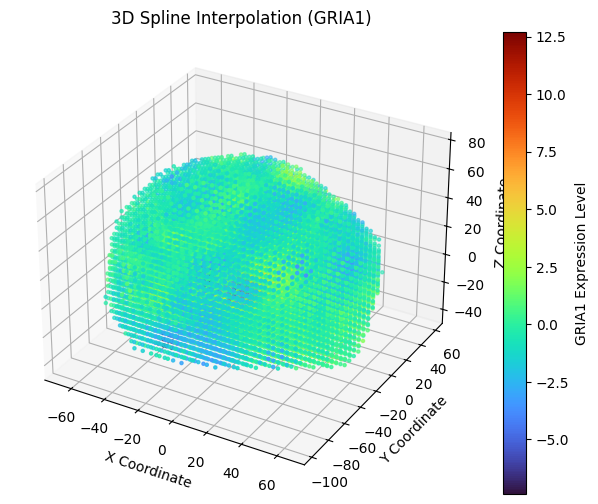

Processing GRIA2...


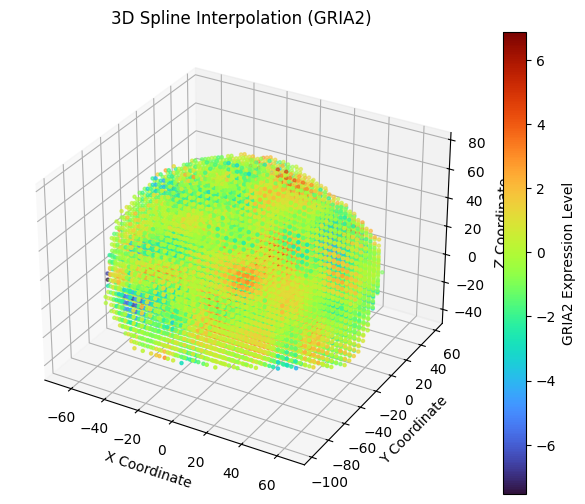

Processing GRIA3...


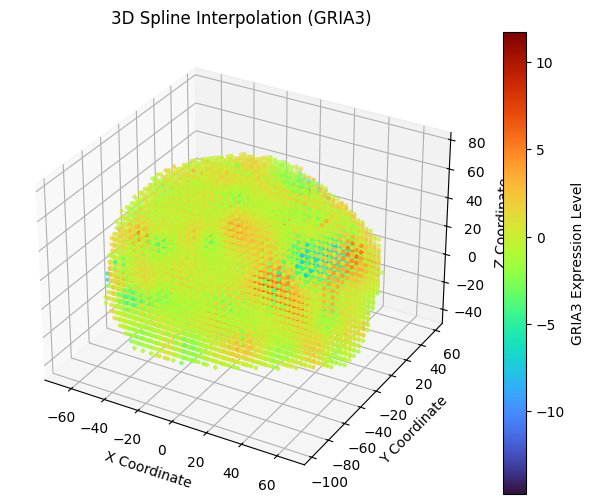

Processing GRIA4...


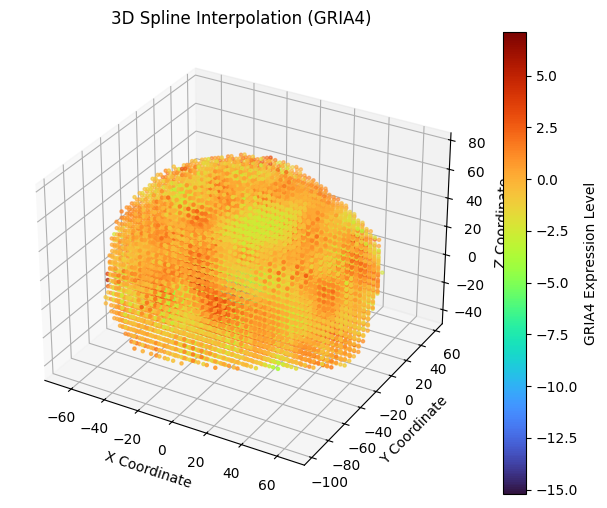

Processing GRIN1...


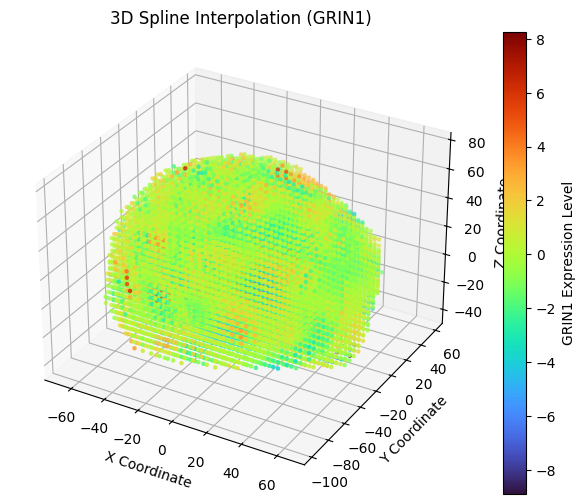

Processing GRIN2A...


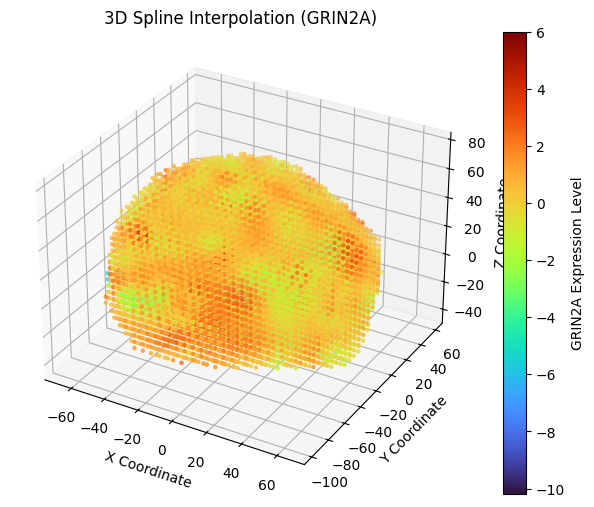

Processing GRIN2B...


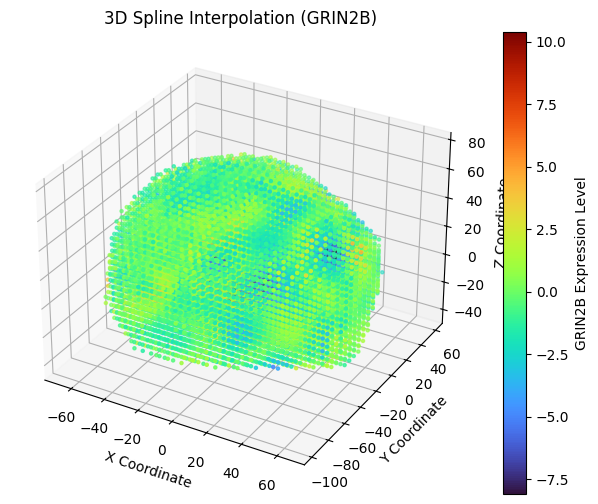

Processing GRIN2C...


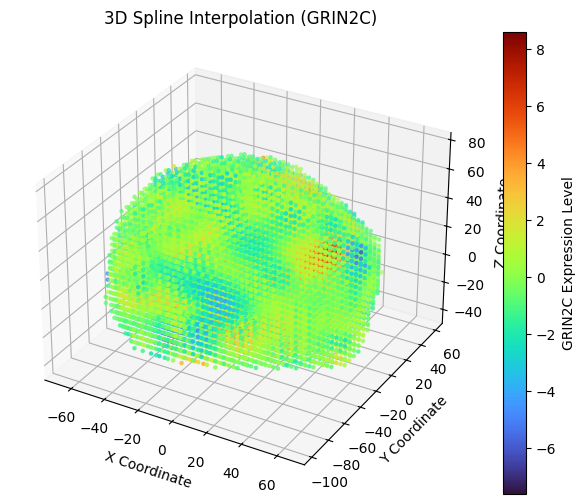

Processing GRIN2D...


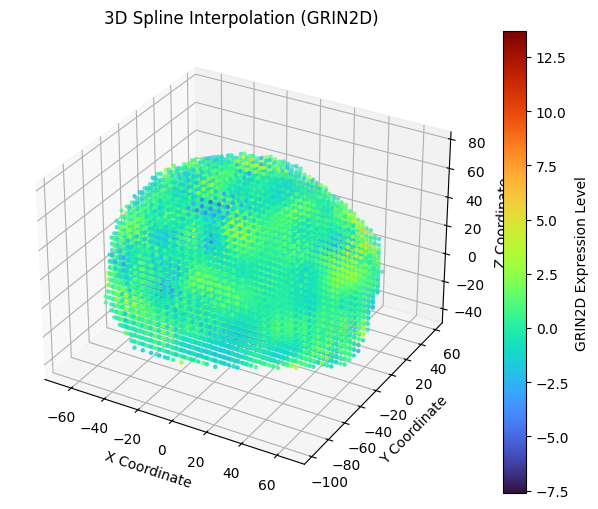

Processing GRM1...


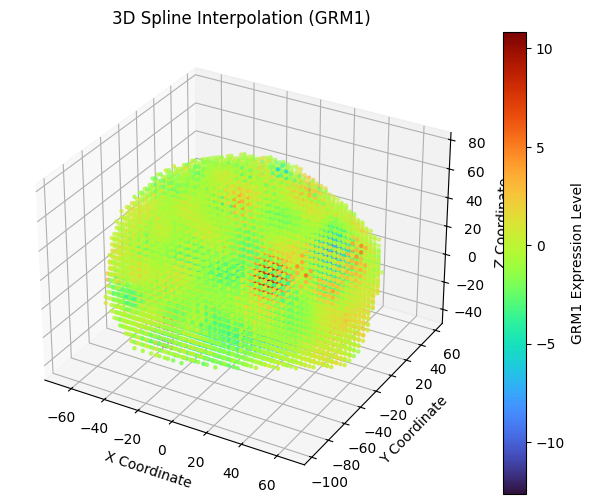

Processing GRM2...


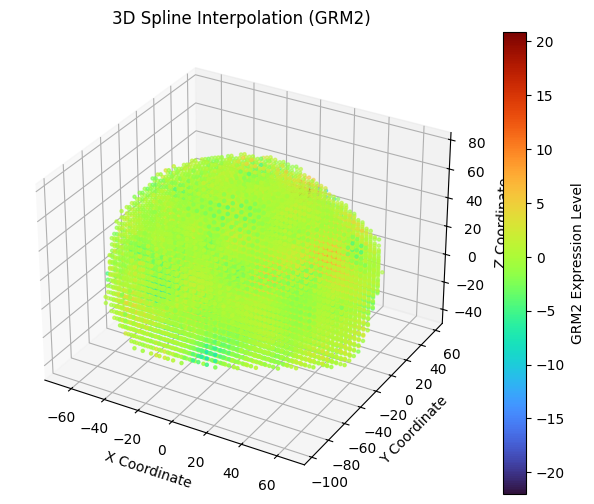

Processing GRM3...


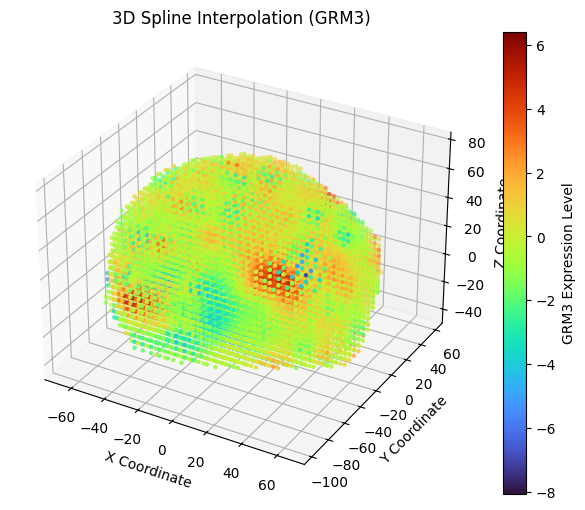

Processing GRM4...


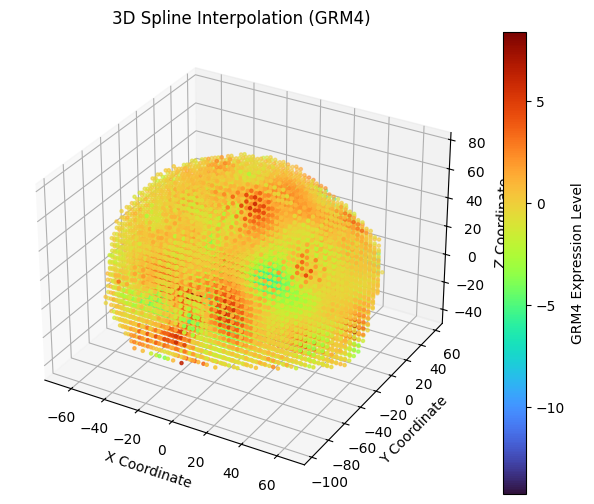

Processing GRM5...


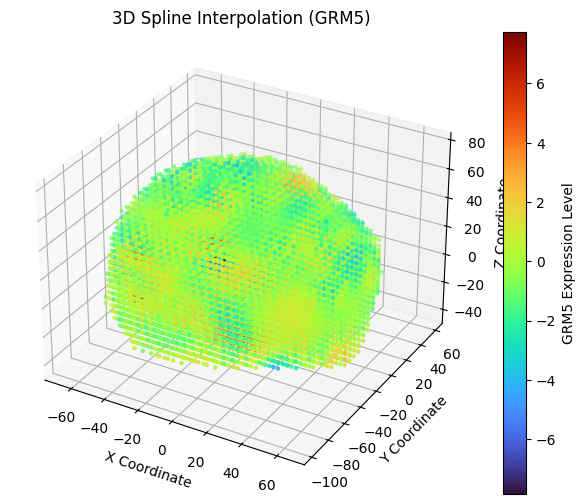

Processing GRM7...


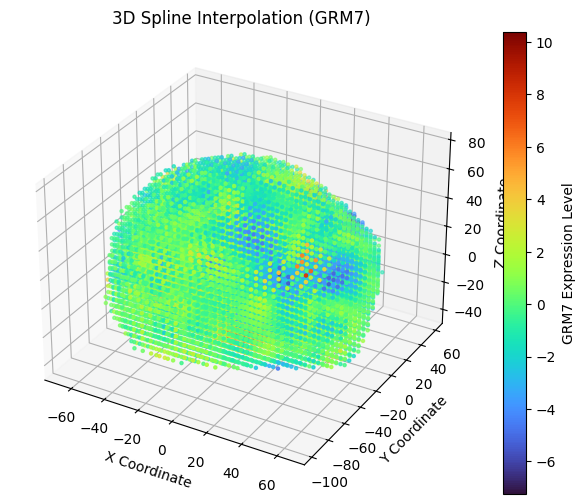

Processing GRM8...


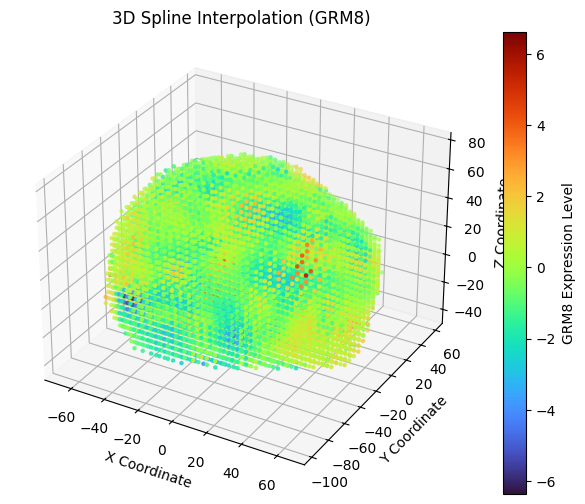

Processing GABRA1...


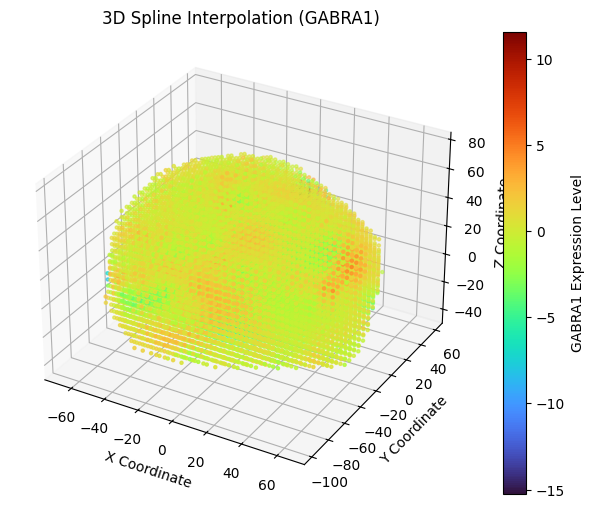

Processing GABRA2...


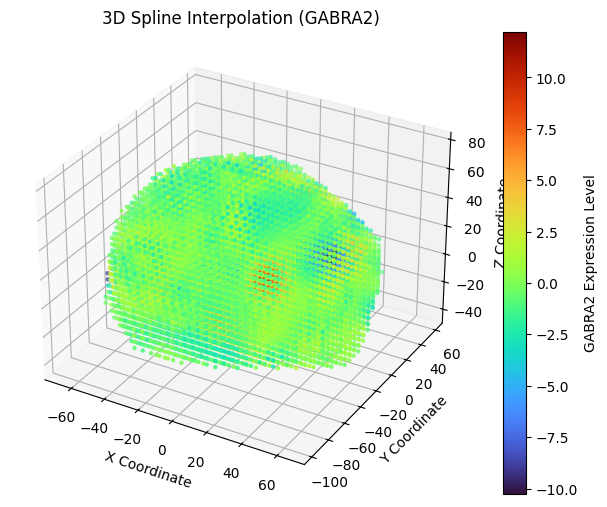

Processing GABRA3...


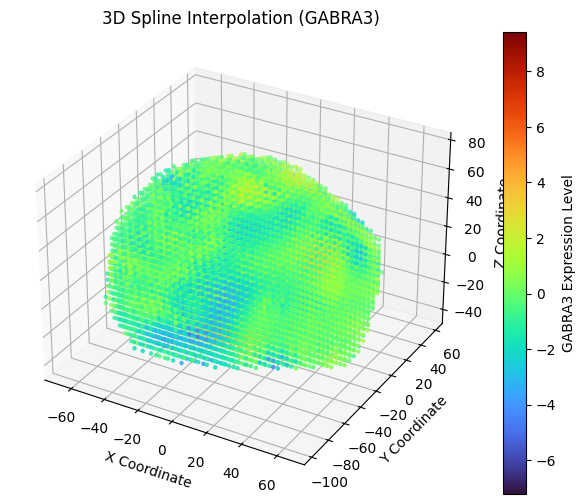

Processing GABRA4...


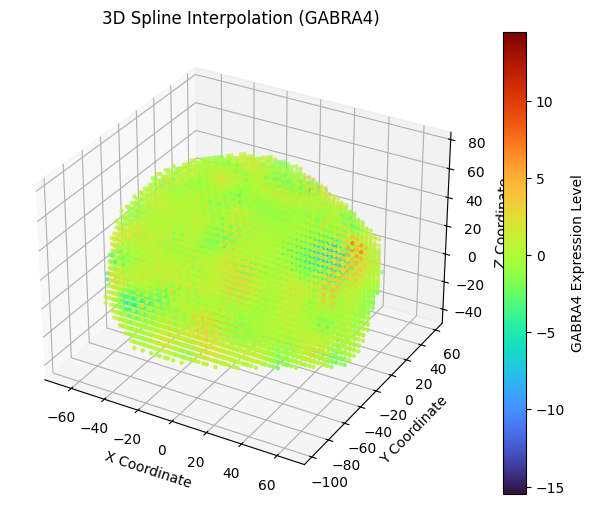

Processing GABRA5...


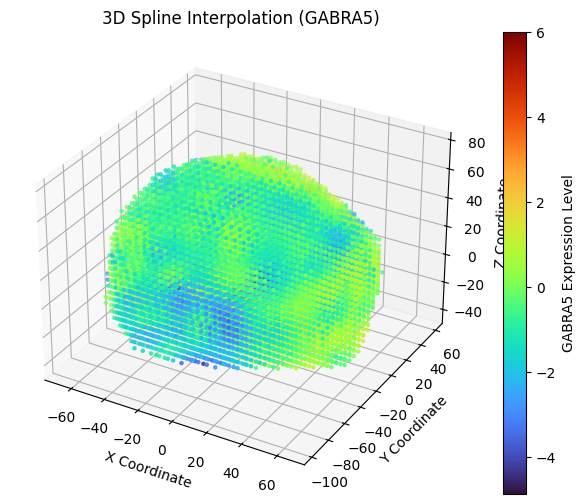

Processing GABRB1...


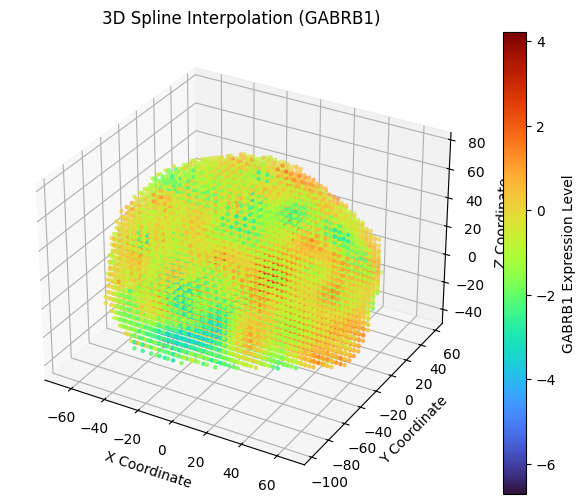

Processing GABRB2...


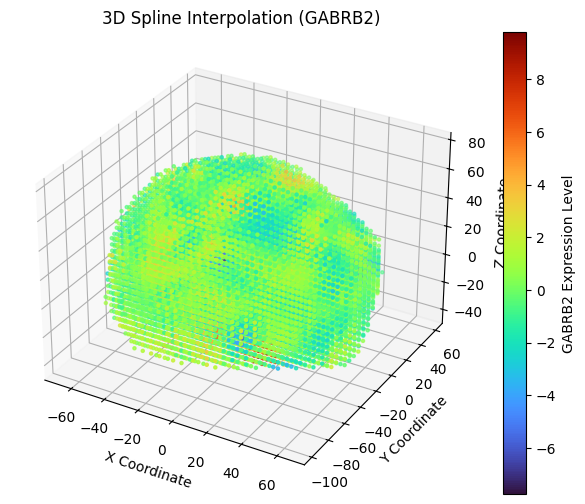

Processing GABRB3...


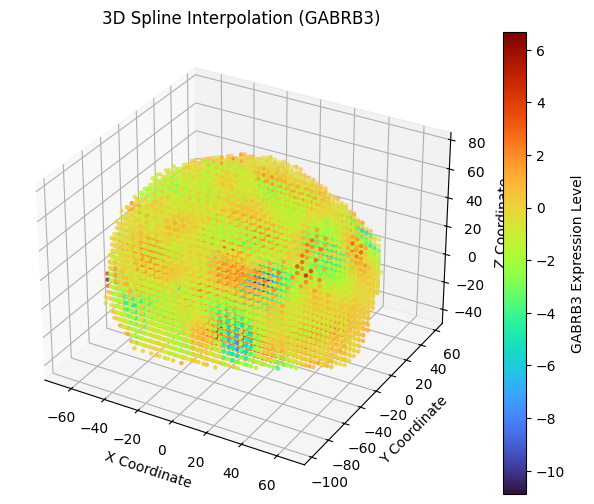

Processing GABRG1...


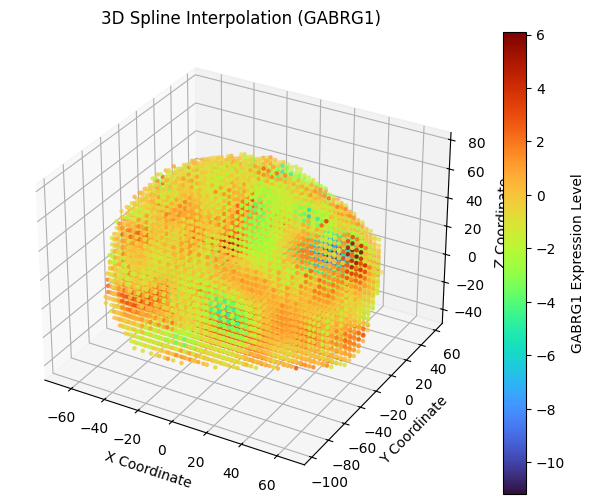

Processing GABRG2...


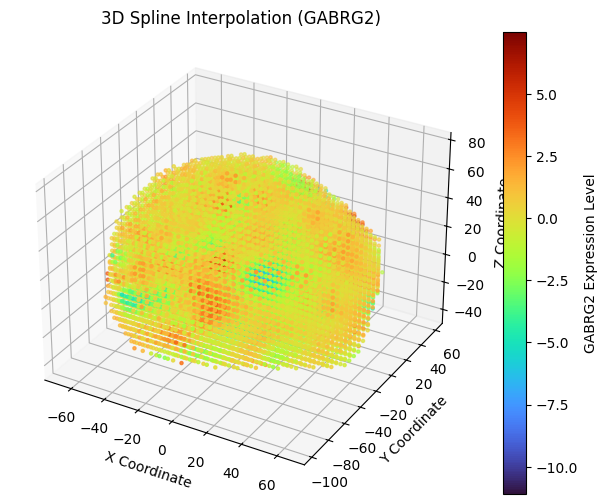

Processing GABRG3...


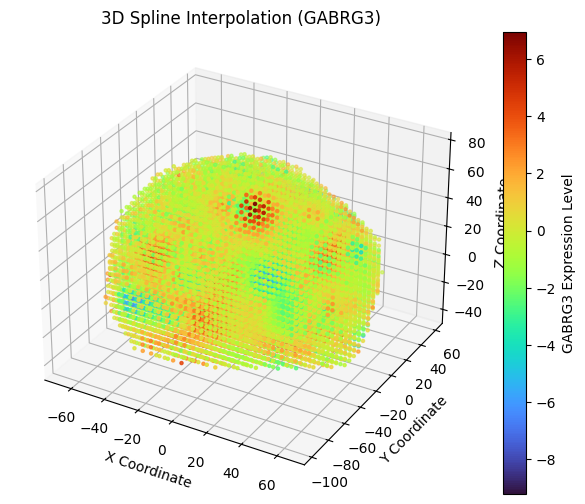

Processing CHRNB1...


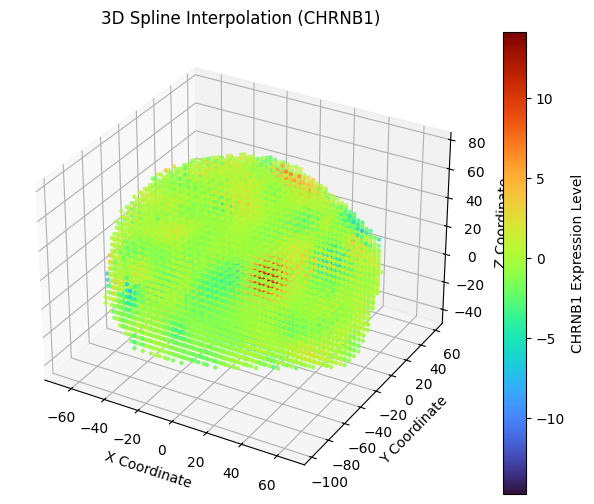

Processing CHRNB2...


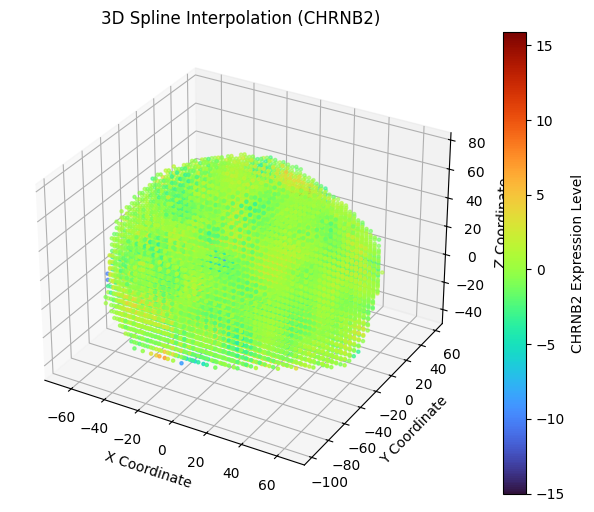

Processing CHRM1...


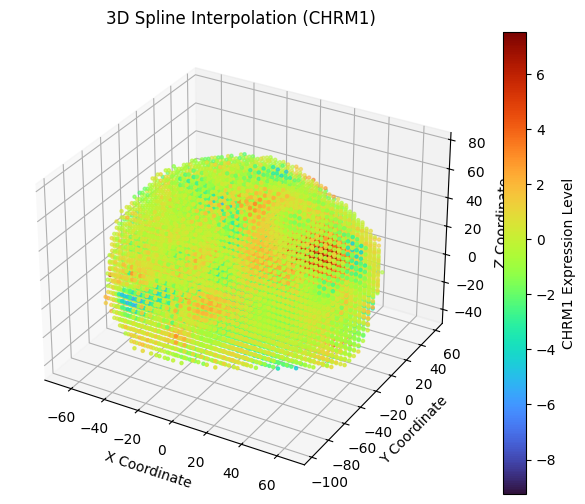

Processing CHRM2...


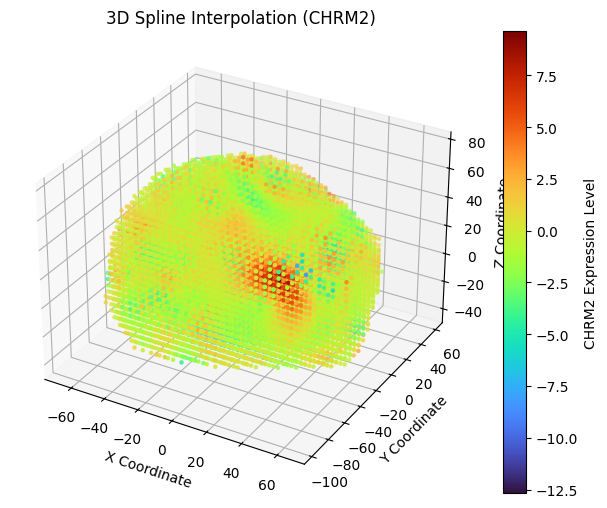

Processing CHRM3...


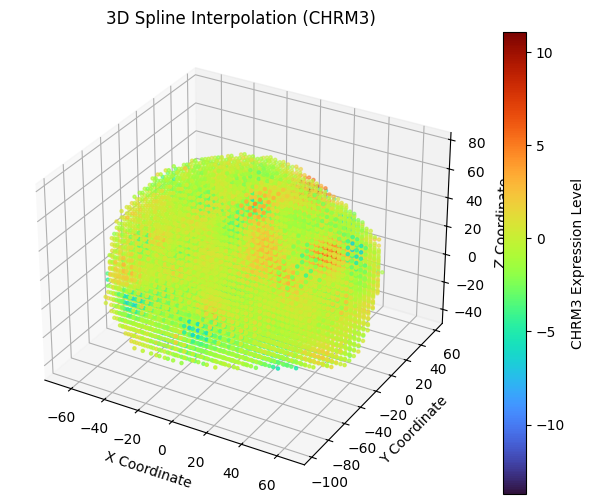

Processing CHRM4...


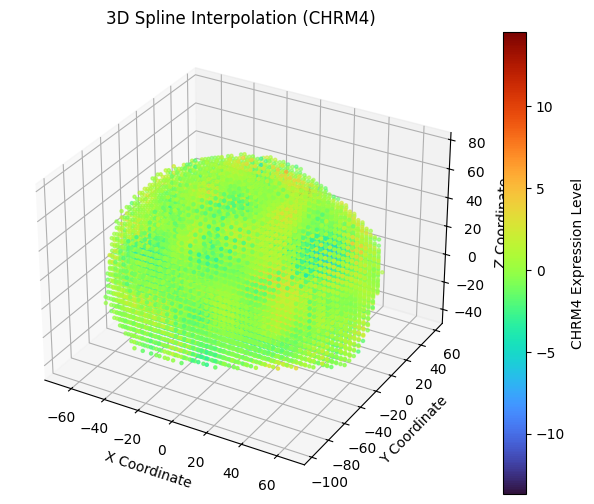

Processing CHRM5...


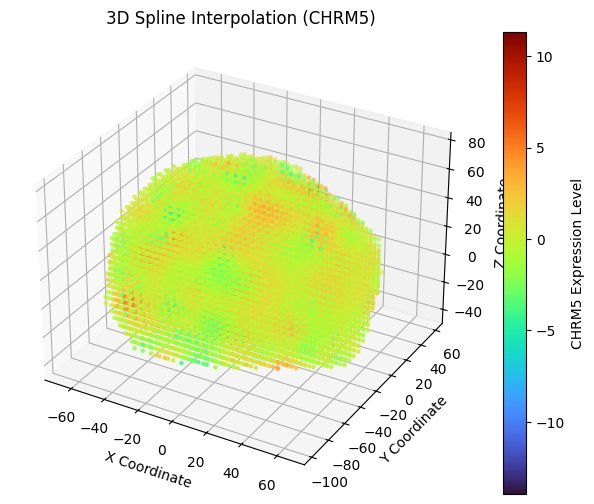

Processing HTR1A...


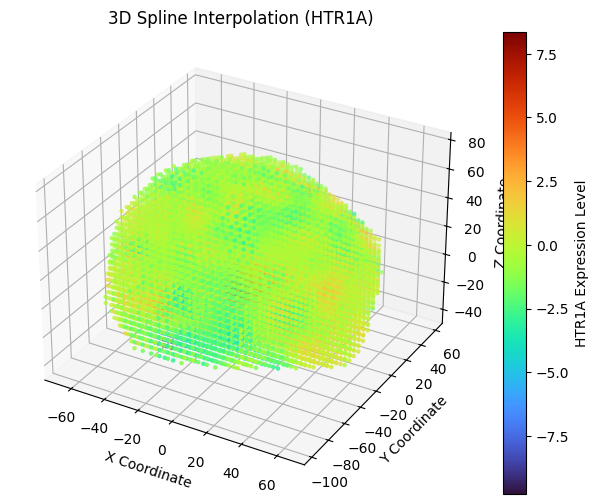

Processing HTR1E...


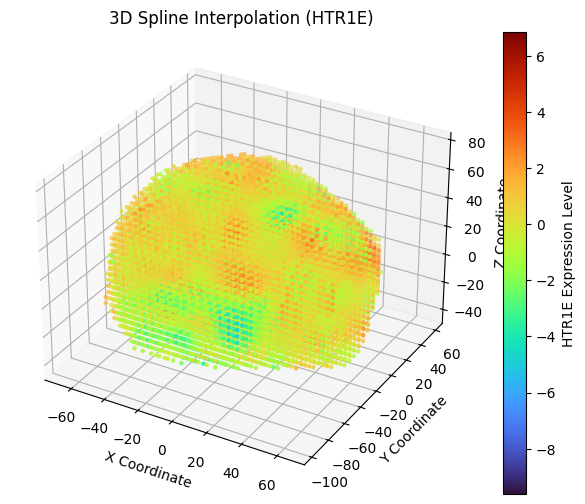

Processing HTR1F...


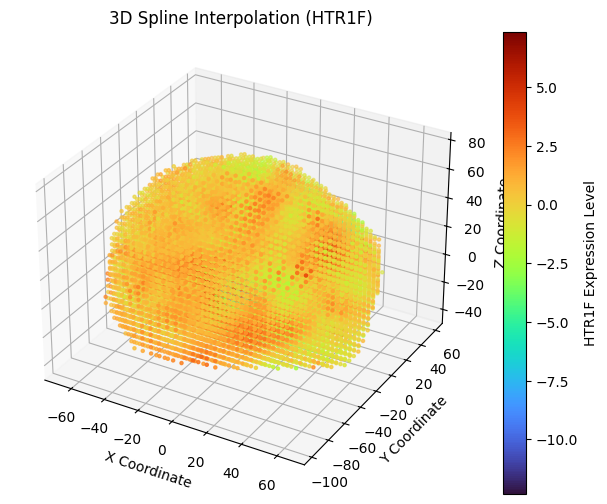

Processing HTR2A...


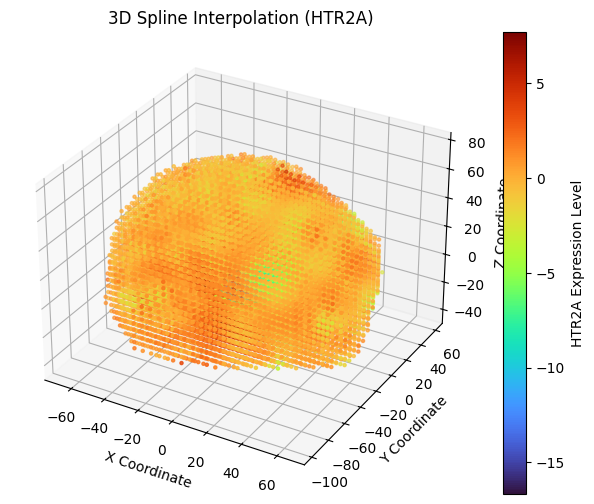

Processing HTR2C...


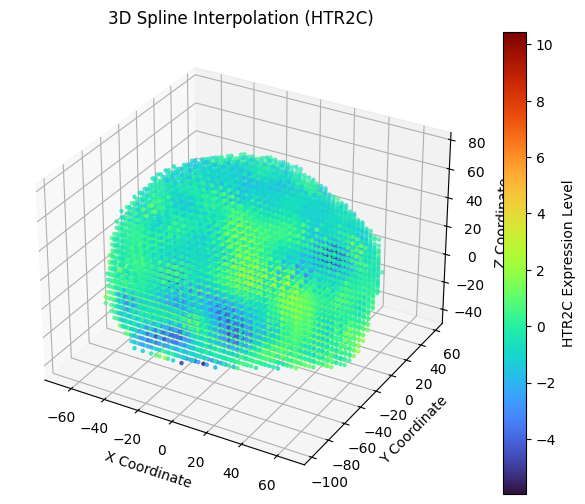

Processing HTR3B...


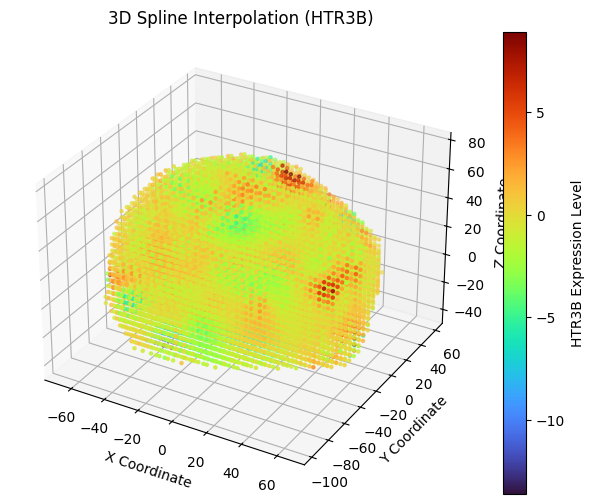

Processing HTR4...


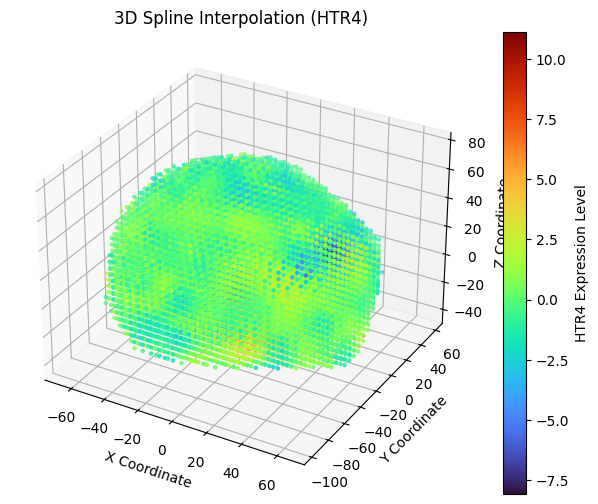

Processing HTR5A...


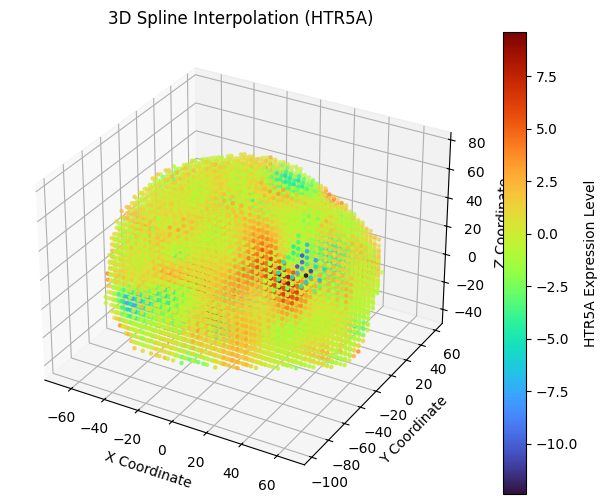

Processing HTR7...


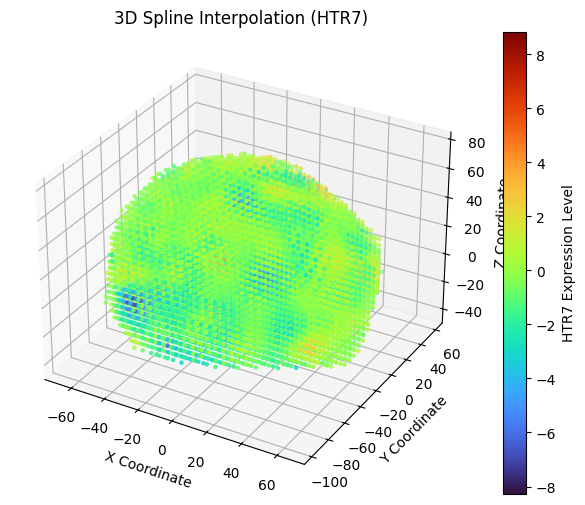

Processing DRD1...


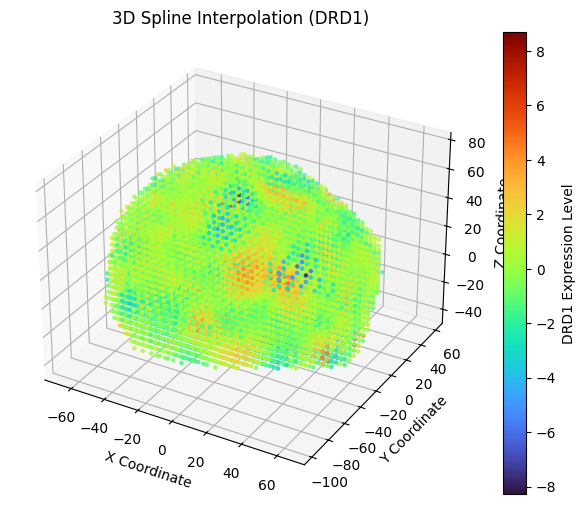

Processing DRD2...


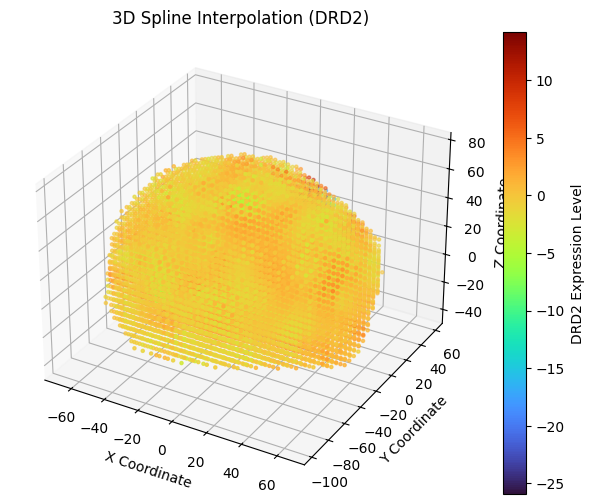

Processing DRD4...


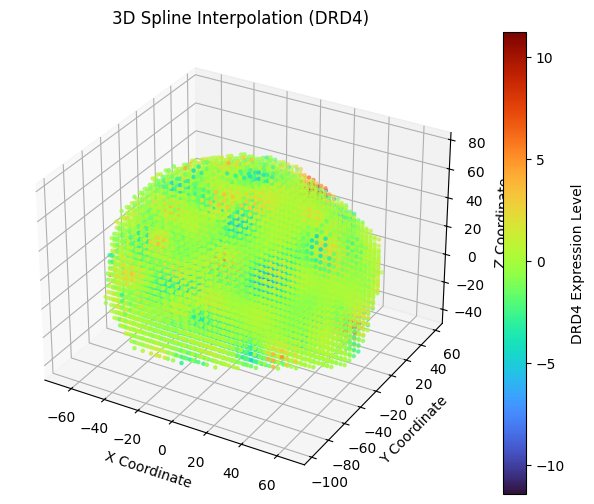


Spline Interpolation Evaluation Metrics:
             MSE       MAE      RMSE        R²
GRIA1   0.000160  0.003686  0.012655  0.999840
GRIA2   0.000227  0.005382  0.015061  0.999773
GRIA3   0.000540  0.006097  0.023235  0.999459
GRIA4   0.000156  0.004767  0.012502  0.999843
GRIN1   0.000246  0.005821  0.015685  0.999753
GRIN2A  0.000175  0.003664  0.013244  0.999823
GRIN2B  0.000229  0.005038  0.015142  0.999770
GRIN2C  0.000187  0.003991  0.013686  0.999812
GRIN2D  0.000354  0.006485  0.018802  0.999645
GRM1    0.000422  0.005352  0.020535  0.999576
GRM2    0.000840  0.006689  0.028990  0.999157
GRM3    0.000204  0.004785  0.014287  0.999794
GRM4    0.000238  0.005152  0.015431  0.999761
GRM5    0.000218  0.004802  0.014756  0.999781
GRM7    0.000378  0.005783  0.019432  0.999619
GRM8    0.000088  0.003833  0.009394  0.999911
GABRA1  0.000320  0.004126  0.017892  0.999678
GABRA2  0.000351  0.005048  0.018730  0.999650
GABRA3  0.000164  0.003946  0.012788  0.999835
GABRA4  0.000598  

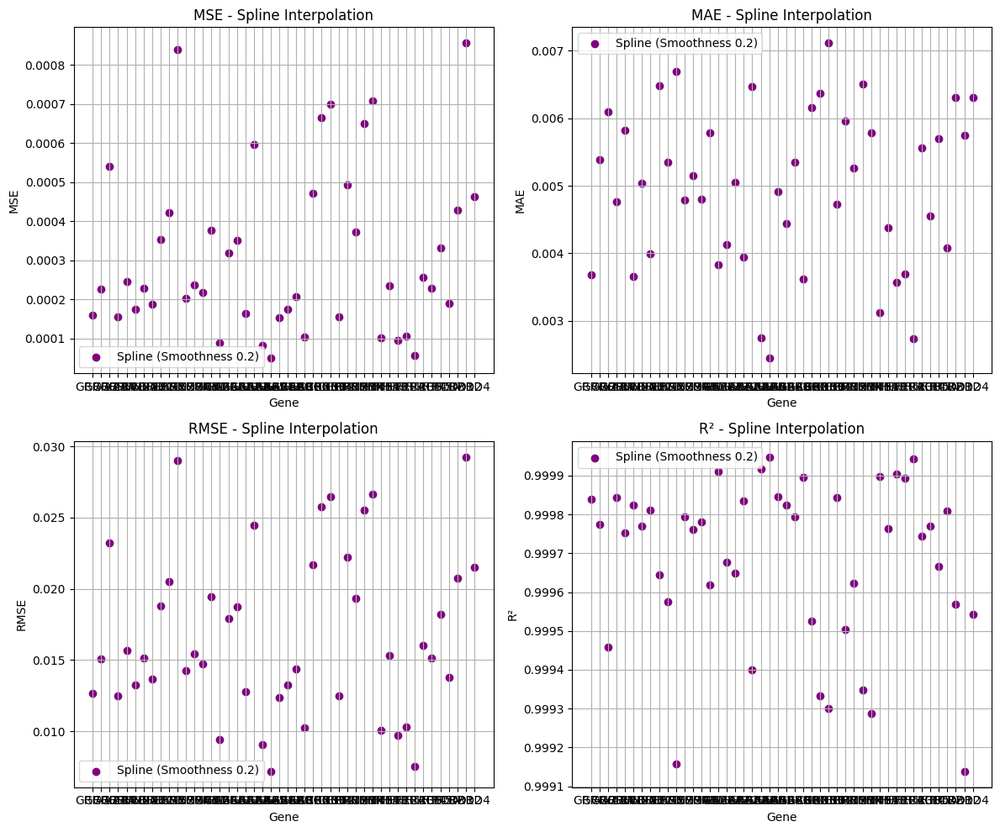

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import Rbf
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
import pandas as pd
import time
from scipy.spatial import ConvexHull, Delaunay
import cupy as cp

# Load data using NumPy for compatibility with SciPy
expression_coords = np.load('expression_coords.npy')
expression_data = np.load('expression.npy', allow_pickle=True).item()

# Move only numerical data to CuPy for GPU processing
x = cp.asarray(expression_coords[:, 0])
y = cp.asarray(expression_coords[:, 1])
z = cp.asarray(expression_coords[:, 2])

# Create a grid for interpolation
resolution = 30
grid_x, grid_y, grid_z = np.meshgrid(
    np.linspace(cp.asnumpy(x).min(), cp.asnumpy(x).max(), resolution),
    np.linspace(cp.asnumpy(y).min(), cp.asnumpy(y).max(), resolution),
    np.linspace(cp.asnumpy(z).min(), cp.asnumpy(z).max(), resolution)
)

grid_points = np.column_stack((grid_x.ravel(), grid_y.ravel(), grid_z.ravel()))

#Create convex hull to mask out points outside brain shape
xyz_points = np.column_stack((cp.asnumpy(x), cp.asnumpy(y), cp.asnumpy(z)))
hull = ConvexHull(xyz_points)
delaunay = Delaunay(xyz_points)

inside_hull = delaunay.find_simplex(grid_points) >= 0
valid_points = grid_points[inside_hull]

# Initialise evaluation metrics
evaluation_metrics_spline = {}

# Run spline interpolation for each gene
for gene, values in expression_data.items():
    print(f"Processing {gene}...")

    values = cp.asarray(values)

    # Convert to NumPy for Rbf compatibility
    start_time = time.time()
    interpolator = Rbf(
        cp.asnumpy(x), cp.asnumpy(y), cp.asnumpy(z),
        cp.asnumpy(values), function='cubic', smooth=0.2
    )
    grid_values = interpolator(valid_points[:, 0], valid_points[:, 1], valid_points[:, 2])
    duration = time.time() - start_time

    # Evaluate at sample points
    interp_values_at_samples = interpolator(cp.asnumpy(x), cp.asnumpy(y), cp.asnumpy(z))

    mse = mean_squared_error(cp.asnumpy(values), interp_values_at_samples)
    mae = mean_absolute_error(cp.asnumpy(values), interp_values_at_samples)
    rmse = sqrt(mse)
    r2 = r2_score(cp.asnumpy(values), interp_values_at_samples)

    evaluation_metrics_spline[gene] = {
        "MSE": mse,
        "MAE": mae,
        "RMSE": rmse,
        "R²": r2
    }

    # 3D plot for each gene
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(valid_points[:, 0], valid_points[:, 1], valid_points[:, 2],
                    c=grid_values, cmap='turbo', s=5)
    ax.set_title(f"3D Spline Interpolation ({gene})")
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_zlabel('Z Coordinate')
    fig.colorbar(sc, label=f"{gene} Expression Level")
    plt.show()

# Create DataFrame for metrics
df_spline = pd.DataFrame(evaluation_metrics_spline).T
print("\nSpline Interpolation Evaluation Metrics:")
print(df_spline)

# Create a scatter plot comparing metrics
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()
metrics = ["MSE", "MAE", "RMSE", "R²"]

for i, metric in enumerate(metrics):
    axes[i].scatter(df_spline.index, df_spline[metric], label='Spline (Smoothness 0.2)', color='purple')
    axes[i].set_title(f"{metric} - Spline Interpolation")
    axes[i].set_xlabel('Gene')
    axes[i].set_ylabel(metric)
    axes[i].grid(True)
    axes[i].legend()

plt.tight_layout()
plt.show()
